## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## 1. Compute the camera calibration using chessboard images

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib qt

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        cv2.imshow('img',img)
        cv2.waitKey(500)

cv2.destroyAllWindows()

In [2]:
ls

camera_cal/                      output_images/
challenge_video.mp4              P4.ipynb
challenge_video_out1.mp4         project_video.mp4
debug/                           project_video_out1.mp4
examples/                        README.md
example_writeup.pdf              test_images/
harder_challenge_video.mp4       writeup_template.md
harder_challenge_video_out1.mp4


## 2. Apply a distortion correction to raw images

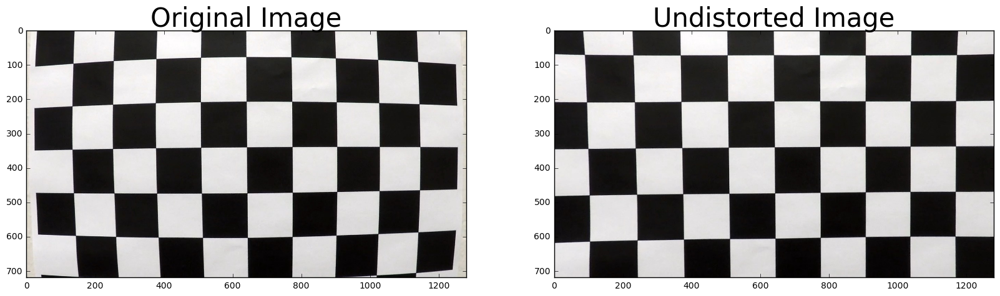

In [3]:
import pickle
%matplotlib inline

# Test undistortion on an image
#img = cv2.imread('test_images/test1.jpg')
img = cv2.imread('camera_cal/calibration1.jpg')
img_size = (img.shape[1], img.shape[0])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)

dst = cv2.undistort(img, mtx, dist, None, mtx)
#cv2.imwrite('output_images/test1_undist.jpg',dst)
cv2.imwrite('output_images/calibration1_undist.jpg',dst)

# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "camera_cal/wide_dist_pickle.p", "wb" ) )

img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)

# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

## 3. Use color transforms, gradients, etc., to create a thresholded binary image

This image is: <class 'numpy.ndarray'> with dimesions: (720, 1280, 3)


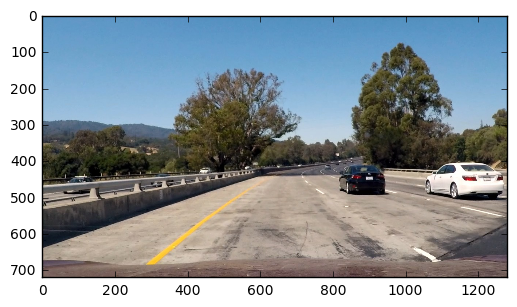

In [30]:
import matplotlib.image as mpimg

#reading in an image
im = mpimg.imread('test_images/test1.jpg')

#printing out some stats and plotting
print('This image is:', type(im), 'with dimesions:', im.shape)
plt.imshow(im)  # if you wanted to show a single color channel image called 'gray', for example, call as plt.imshow(gray, cmap='gray')

In [31]:
def select_white_yellow(img):
    """Applies color selection for white and yellow"""
    hls_img = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    # white color mask
    lower = np.array([  0, 200,   0], dtype="uint8")
    upper = np.array([255, 255, 255], dtype="uint8")
    white_mask = cv2.inRange(hls_img, lower, upper)
    # yellow color mask
    lower = np.array([ 10,   0, 100], dtype="uint8")
    upper = np.array([ 40, 255, 255], dtype="uint8")
    yellow_mask = cv2.inRange(hls_img, lower, upper)
    # combine the mask
    white_yellow_mask = cv2.bitwise_or(white_mask, yellow_mask)
    return cv2.bitwise_and(img, img, mask = white_yellow_mask)

def grayscale(img):
    """Applies the Grayscale transform
    This will return an image with only one color channel
    but NOTE: to see the returned image as grayscale
    (assuming your grayscaled image is called 'gray')
    you should call plt.imshow(gray, cmap='gray')"""
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Or use BGR2GRAY if you read an image with cv2.imread()
    # return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

## Helper Functions

In [48]:
def undistort(img, mtx, dist):
    return cv2.undistort(img, mtx, dist, None, mtx)

In [49]:
class Transformer():
    def __init__(self, img):
        (h, w) = (img.shape[0], img.shape[1]) # 720, 1280
        src = np.float32([[w // 2 - 76, h * .625], [w // 2 + 76, h * .625], [-100, h], [w + 100, h]])
        dst = np.float32([[100, 0], [w - 100, 0], [100, h], [w - 100, h]])    
        
        #src = np.array([[585, 460], [203, 720], [1127, 720], [695, 460]]).astype(np.float32)
        #dst = np.array([[320, 0], [320, 720], [960, 720], [960, 0]]).astype(np.float32)
        
        self.M = cv2.getPerspectiveTransform(src, dst)
        self.Minv = cv2.getPerspectiveTransform(dst, src)
        
    def warp(self, img):
        return cv2.warpPerspective(img, self.M, (img.shape[1], img.shape[0]))
    
    def unwarp(self, img):
        return cv2.warpPerspective(img, self.Minv, (img.shape[1], img.shape[0]))

In [50]:
# Create transformer object, this means that the transformer matrix only needs to be computed once
transform = Transformer(im)

In [51]:
def grad_abs_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # Convert to grayscale
    #gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return binary_output

def grad_mag_thresh(img, sobel_kernel=3, thresh=(0, 255)):
    # Convert to grayscale
    #gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= thresh[0]) & (gradmag <= thresh[1])] = 1
    # Return the binary image
    return binary_output

def grad_dir_thresh(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    #gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1
    # Return the binary image
    return binary_output

def color_thresh(img, thresh=(0, 255)):
    binary_output = np.zeros_like(img)
    binary_output[(img > thresh[0]) & (img <= thresh[1])] = 1
    return binary_output

def get_mask(img, debug=False):
    hls = cv2.cvtColor(np.copy(img), cv2.COLOR_RGB2HLS).astype(np.float)
    s_channel = hls[:, :, 2]
    # Get a combination of all gradient thresholding masks
    gradient_x = grad_abs_thresh(s_channel, orient='x', sobel_kernel=3, thresh=(20, 100))
    gradient_y = grad_abs_thresh(s_channel, orient='y', sobel_kernel=3, thresh=(20, 100))
    magnitude = grad_mag_thresh(s_channel, sobel_kernel=3, thresh=(20, 100))
    direction = grad_dir_thresh(s_channel, sobel_kernel=3, thresh=(0.7, 1.3))
    gradient_mask = np.zeros_like(s_channel)
    gradient_mask[((gradient_x == 1) & (gradient_y == 1)) | ((magnitude == 1) & (direction == 1))] = 1
    # Get a color thresholding mask
    color_mask = color_thresh(s_channel, thresh=(170, 255))

    if debug:
        return np.dstack((np.zeros_like(s_channel), gradient_mask, color_mask))
    else:
        mask = np.zeros_like(gradient_mask)
        mask[(gradient_mask == 1) | (color_mask == 1)] = 1
        
    return mask    


In [91]:
def find_lines(binary_warped):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 10 # 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 80 #100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    return left_fit, right_fit

In [92]:

# Plot the polygons on the image
def plot_poly_orig(fitl, fitr, orig):
    # Draw lines from polynomials
    ploty = np.linspace(0, orig.shape[0]-1, orig.shape[0])
    fitl = fitl[0]*ploty**2 + fitl[1]*ploty + fitl[2]
    fitr = fitr[0]*ploty**2 + fitr[1]*ploty + fitr[2]
    
    pts_left = np.array([np.transpose(np.vstack([fitl, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([fitr, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    # Create an overlay from the lane lines
    overlay = np.zeros_like(orig).astype(np.uint8)
    cv2.fillPoly(overlay, np.int_([pts]), (0,255, 0))
    
    # Apply inverse transform to the overlay to plot it on the original road
    overlay = transform.unwarp(overlay)
    
    # Add the overlay to the original unwarped image
    result = cv2.addWeighted(orig, 1, overlay, 0.3, 0)
    return result



## Pipeline

In [156]:
last_l_poly = None
last_r_poly = None

def process_image(img):
    global last_l_poly, last_r_poly
    # NOTE: The output you return should be a color image (3 channel) for processing video below
    # TODO: put your pipeline here,
    # you should return the final output (image where lines are drawn on lanes)
    
    img = undistort(img, mtx, dist)

    
    # Keep the untransformed image for later
    orig = img.copy()
    
    #img = get_mask(img)
    #img = mask_image(img)
    
    img = select_white_yellow(img)
    img = grayscale(img)
    img = transform.warp(img)
    
    l_poly, r_poly = find_lines(img)
    
    # Update polynomials using weighted average with last frame
    if last_l_poly is None:
        # If first frame, initialise buffer
        last_l_poly = l_poly
        last_r_poly = r_poly
    else:
        # Otherwise, update buffer
        l_poly = 0.8 * last_l_poly + 0.2 * l_poly
        r_poly = 0.8 * last_r_poly + 0.2 * r_poly
        last_l_poly = l_poly
        last_r_poly = r_poly
    
    # Create image
    final = plot_poly_orig(l_poly, r_poly, orig)
        
    # Write radius on image
    #cv2.putText(final, 'Lane Radius: {}m'.format(int(last_rad)), (10, 50), cv2.FONT_HERSHEY_DUPLEX, 1.5, 255)
    # Write lane offset on image
    #offset = find_offset(l_poly, r_poly)
    #cv2.putText(final, 'Lane Offset: {}m'.format(round(offset, 4)), (10, 100), cv2.FONT_HERSHEY_DUPLEX, 1.5, 255)
    
    return final
    

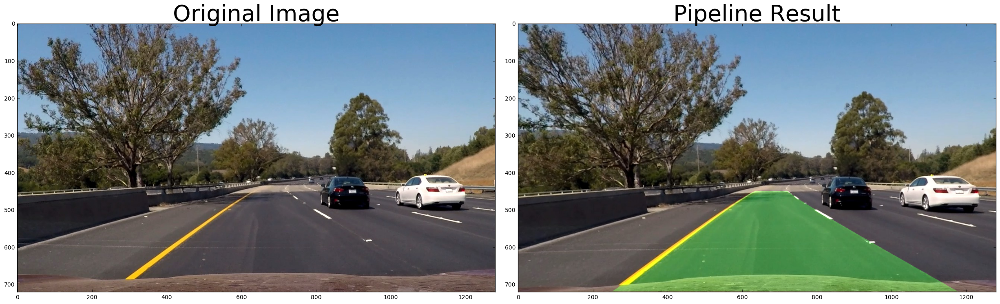

In [157]:
last_l_poly = None
last_r_poly = None

original = mpimg.imread('test_images/test6.jpg')
result = process_image(original)


# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(original)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(result, cmap='gray')
ax2.set_title('Pipeline Result', fontsize=40)
    
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

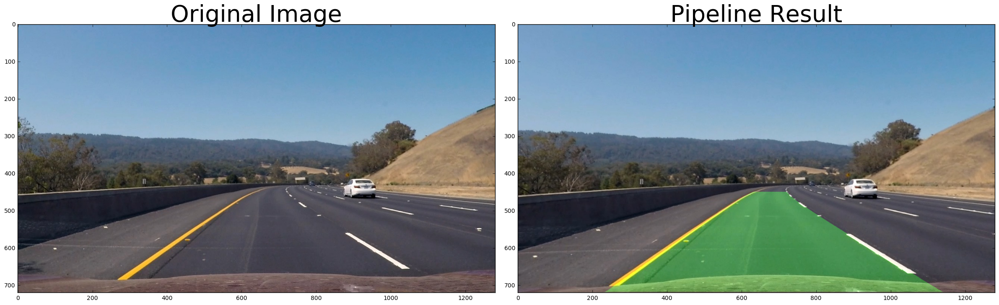

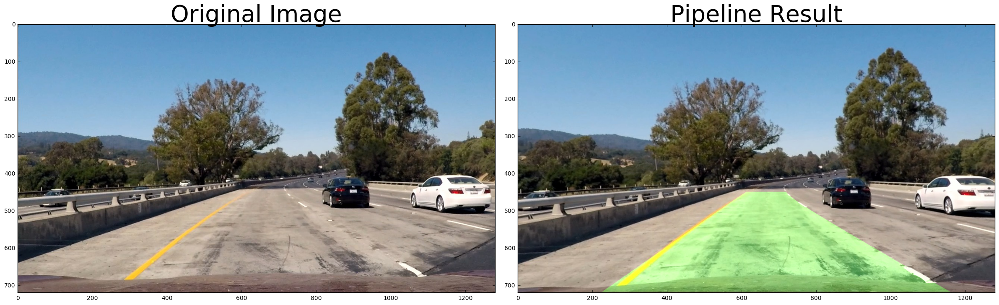

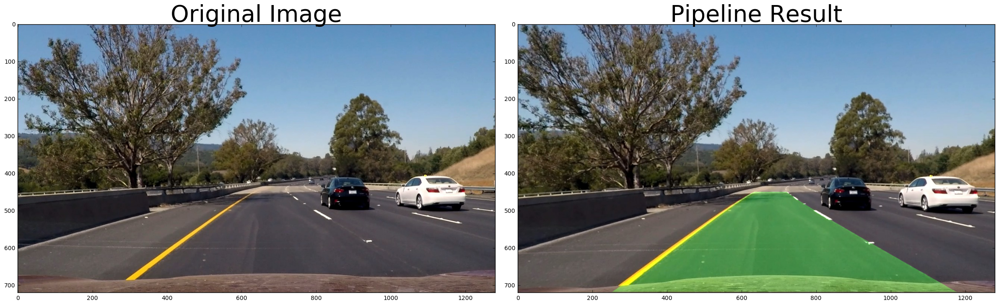

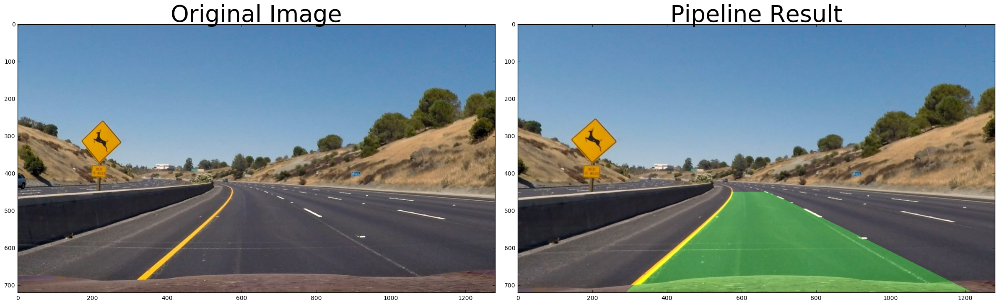

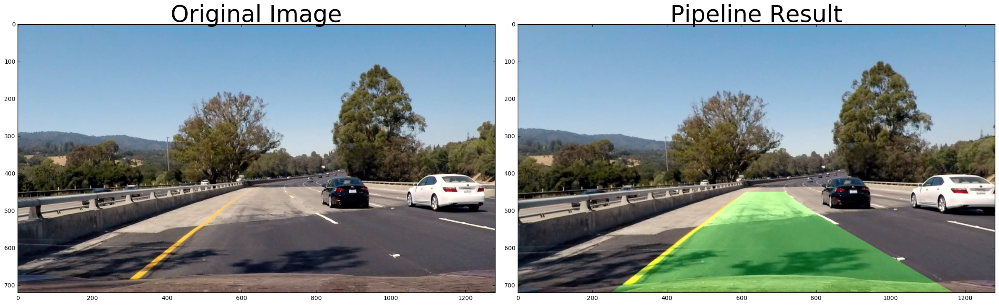

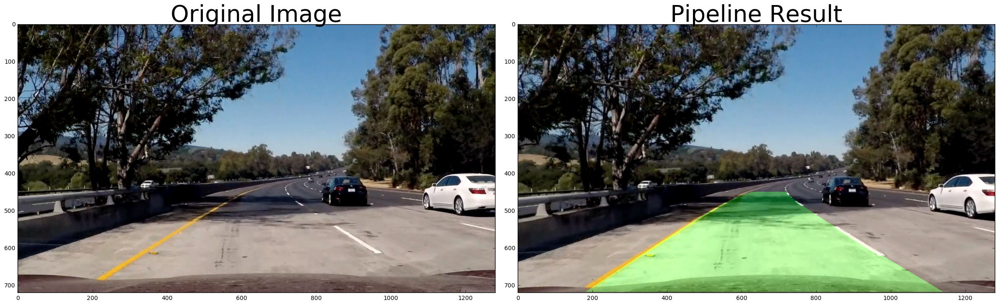

In [158]:
# test case
images = glob.glob('test_images/test*.jpg')
for idx, fname in enumerate(images):
    last_l_poly = None
    last_r_poly = None
    original = mpimg.imread(fname)
    result = process_image(original)

    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(original)
    ax1.set_title('Original Image', fontsize=40)

    ax2.imshow(result, cmap='gray')
    ax2.set_title('Pipeline Result', fontsize=40)

## Test on Videos

In [61]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [152]:
last_l_poly = None
last_r_poly = None

white_output = 'project_video_out1.mp4'
#clip1 = VideoFileClip("project_video.mp4").subclip(0,5)
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video project_video_out1.mp4
[MoviePy] Writing video project_video_out1.mp4






  0%|          | 0/1261 [00:00<?, ?it/s]



  0%|          | 2/1261 [00:00<01:33, 13.54it/s]



  0%|          | 4/1261 [00:00<01:24, 14.89it/s]



  0%|          | 6/1261 [00:00<01:18, 16.09it/s]



  1%|          | 8/1261 [00:00<01:14, 16.92it/s]



  1%|          | 10/1261 [00:00<01:11, 17.42it/s]



  1%|          | 12/1261 [00:00<01:09, 17.94it/s]



  1%|          | 14/1261 [00:00<01:09, 17.98it/s]



  1%|▏         | 16/1261 [00:00<01:07, 18.40it/s]



  1%|▏         | 18/1261 [00:00<01:06, 18.67it/s]



  2%|▏         | 20/1261 [00:01<01:05, 18.94it/s]



  2%|▏         | 22/1261 [00:01<01:08, 18.20it/s]



  2%|▏         | 24/1261 [00:01<01:07, 18.27it/s]



  2%|▏         | 26/1261 [00:01<01:06, 18.66it/s]



  2%|▏         | 28/1261 [00:01<01:07, 18.18it/s]



  2%|▏         | 30/1261 [00:01<01:09, 17.74it/s]



  3%|▎         | 32/1261 [00:01<01:10, 17.55it/s]



  3%|▎         | 34/1261 [00:01<01:09, 17.73it/s]



  3%|▎         | 36/1261 [00:01<01:09, 17.74it/s]



  

[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_out1.mp4 

CPU times: user 3min 19s, sys: 2.22 s, total: 3min 21s
Wall time: 1min 18s
